<a href="https://colab.research.google.com/github/ashishbongu/climapredict/blob/main/tempChange.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



































### **GLOBAL TEMPERATURE PREDICTION MODEL**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import mean_squared_error

In [ ]:
file_path = "/content/drive/MyDrive/temperature.xls"
df = pd.read_excel(file_path)

In [ ]:
print(df.describe())


              Year  No_Smoothing   Lowess(5)
count   144.000000    144.000000  144.000000
mean   1951.500000      0.066389    0.065903
std      41.713307      0.379683    0.368477
min    1880.000000     -0.490000   -0.420000
25%    1915.750000     -0.200000   -0.222500
50%    1951.500000     -0.045000   -0.040000
75%    1987.250000      0.280000    0.280000
max    2023.000000      1.170000    1.010000


NaN values found in the dataset.
Epoch 0: Mean Squared Error = 1.0000
Epoch 100: Mean Squared Error = 0.2035
Epoch 200: Mean Squared Error = 0.1895
Epoch 300: Mean Squared Error = 0.1893
Epoch 400: Mean Squared Error = 0.1893
Epoch 500: Mean Squared Error = 0.1893
Epoch 600: Mean Squared Error = 0.1893
Epoch 700: Mean Squared Error = 0.1893
Epoch 800: Mean Squared Error = 0.1893
Epoch 900: Mean Squared Error = 0.1893


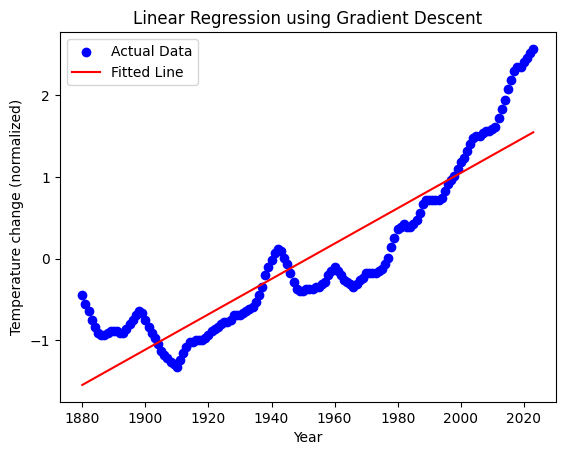

Final Weight (w): 0.9004115143170994
Final Bias (b): -5.597374415818533e-17
Final Mean Squared Error: 0.1893
Predicted value for 2024.0: 1.5704
Predicted value for 2025.0: 1.5921
Predicted value for 2026.0: 1.6137
Predicted value for 2027.0: 1.6354
Predicted value for 2028.0: 1.6571
Predicted value for 2029.0: 1.6787
Predicted value for 2030.0: 1.7004
Predicted value for 2031.0: 1.7221
Predicted value for 2032.0: 1.7437
Predicted value for 2033.0: 1.7654
Predicted value for 2034.0: 1.7870
Predicted value for 2035.0: 1.8087
Predicted value for 2036.0: 1.8304
Predicted value for 2037.0: 1.8520
Predicted value for 2038.0: 1.8737
Predicted value for 2039.0: 1.8953
Predicted value for 2040.0: 1.9170
Predicted value for 2041.0: 1.9387
Predicted value for 2042.0: 1.9603
Predicted value for 2043.0: 1.9820
Predicted value for 2044.0: 2.0036
Predicted value for 2045.0: 2.0253
Predicted value for 2046.0: 2.0470
Predicted value for 2047.0: 2.0686
Predicted value for 2048.0: 2.0903
Predicted value 

In [ ]:
if df.isnull().values.any():
    print("NaN values found in the dataset.")
    df.dropna(inplace=True)

X = df['Year'].values
y = df['Lowess(5)'].values


X = (X - np.mean(X)) / np.std(X)
y = (y - np.mean(y)) / np.std(y)


learning_rate = 0.01
epochs = 1000
n = len(X)

w = 0
b = 0


for epoch in range(epochs):
    y_pred = w * X + b


    dw = -(2/n) * np.sum(X * (y - y_pred))
    db = -(2/n) * np.sum(y - y_pred)


    w -= learning_rate * dw
    b -= learning_rate * db


    if epoch % 100 == 0:
        mse = mean_squared_error(y, y_pred)
        print(f"Epoch {epoch}: Mean Squared Error = {mse:.4f}")


y_final_pred = w * X + b



plt.scatter(df['Year'].values,y, color="blue", label="Actual Data")
plt.plot(df['Year'].values, y_final_pred, color="red", label="Fitted Line")
plt.xlabel("Year")
plt.ylabel("Temperature change (normalized)")
plt.title("Linear Regression using Gradient Descent")
plt.legend()
plt.show()




print(f"Final Weight (w): {w}")
print(f"Final Bias (b): {b}")
print(f"Final Mean Squared Error: {mean_squared_error(y, y_final_pred):.4f}")

current_year = np.max(df['Year'])
future_years = np.arange(current_year + 1, current_year + 30)

future_years_normalized = (future_years - np.mean(df['Year'])) / np.std(df['Year'])


future_predictions_normalized = w * future_years_normalized + b


future_predictions = future_predictions_normalized * np.std(y) + np.mean(y)


for year, prediction in zip(future_years, future_predictions):
    print(f"Predicted value for {year}: {prediction:.4f}")


    all_years = np.concatenate((df['Year'].values, future_years))
all_years_normalized = (all_years - np.mean(df['Year'])) / np.std(df['Year'])



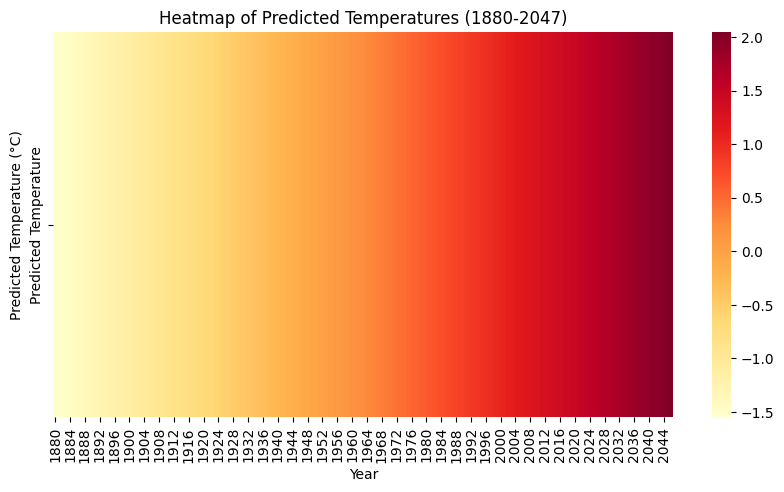

In [ ]:

years_range = np.arange(1880, 2047)
years_range_normalized = (years_range - np.mean(df['Year'])) / np.std(df['Year'])
predicted_temperatures = w * years_range_normalized + b
predicted_temperatures = predicted_temperatures * np.std(y) + np.mean(y)


heatmap_data = pd.DataFrame({
    'Year': years_range,
    'Predicted Temperature': predicted_temperatures
}).set_index('Year')


plt.figure(figsize=(10, 5))
sns.heatmap(heatmap_data.T, cmap='YlOrRd', fmt=".1f")
plt.title('Heatmap of Predicted Temperatures (1880-2047)')
plt.xlabel('Year')
plt.ylabel('Predicted Temperature (°C)')
plt.show()


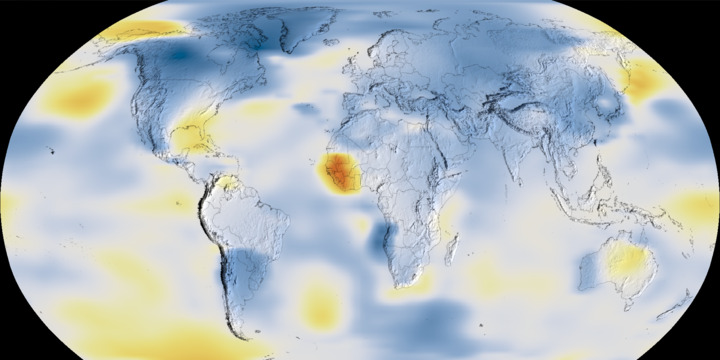

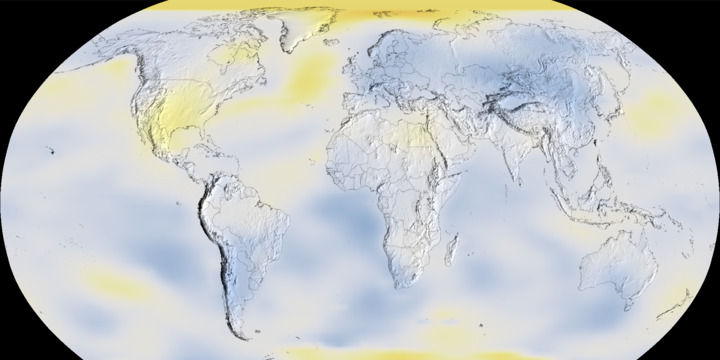

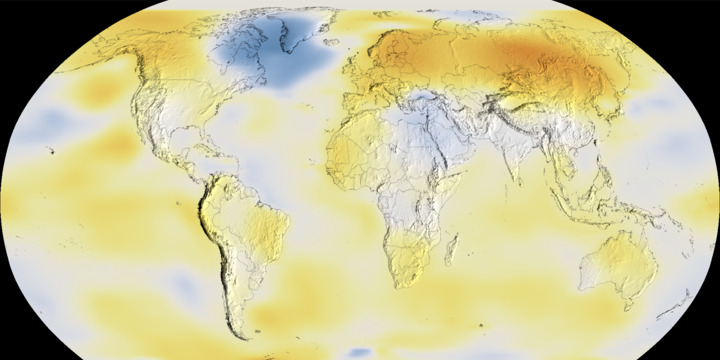

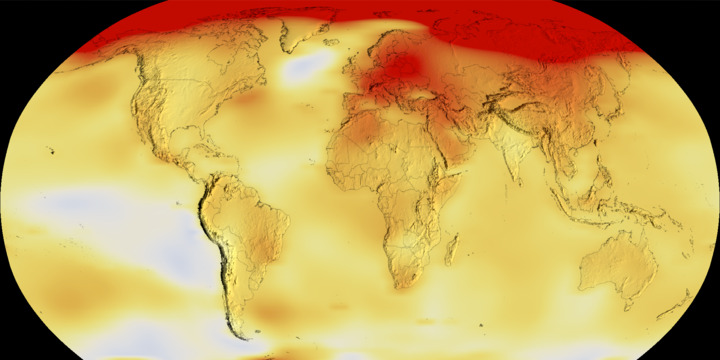

### **CARBON DIOXIDE EMISSION PREDICTION MODEL**

In [ ]:
file_path = "/content/drive/MyDrive/co2emission.xls"
df = pd.read_excel(file_path)


print(df.head())
print(df.info())

   year     ppm
0  1959  315.98
1  1960  316.91
2  1961  317.64
3  1962  318.45
4  1963  318.99
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65 entries, 0 to 64
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   year    65 non-null     int64  
 1   ppm     65 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 1.1 KB
None


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


file_path = "/content/drive/MyDrive/co2emission.xls"
df = pd.read_excel(file_path)

print(df.head())
print(df.info())

   year     ppm
0  1959  315.98
1  1960  316.91
2  1961  317.64
3  1962  318.45
4  1963  318.99
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65 entries, 0 to 64
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   year    65 non-null     int64  
 1   ppm     65 non-null     float64
dtypes: float64(1), int64(1)
memory usage: 1.1 KB
None


In [ ]:
X = df[['year']].values
y = df['ppm'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:

model = LinearRegression()
model.fit(X_train, y_train)


r_squared = model.score(X_test, y_test)
print(f"Model R-squared: {r_squared:.4f}")


Model R-squared: 0.9788


In [ ]:

last_year = df['year'].max()
future_years = np.arange(last_year + 1, last_year + 30).reshape(-1, 1)


future_emissions = model.predict(future_years)


for year, emission in zip(future_years.flatten(), future_emissions):
    print(f"Predicted CO2 emissions in {year:.0f}: {emission:.2f} ppm")





Predicted CO2 emissions in 2024: 412.59 ppm
Predicted CO2 emissions in 2025: 414.22 ppm
Predicted CO2 emissions in 2026: 415.85 ppm
Predicted CO2 emissions in 2027: 417.48 ppm
Predicted CO2 emissions in 2028: 419.11 ppm
Predicted CO2 emissions in 2029: 420.74 ppm
Predicted CO2 emissions in 2030: 422.37 ppm
Predicted CO2 emissions in 2031: 424.00 ppm
Predicted CO2 emissions in 2032: 425.63 ppm
Predicted CO2 emissions in 2033: 427.26 ppm
Predicted CO2 emissions in 2034: 428.89 ppm
Predicted CO2 emissions in 2035: 430.52 ppm
Predicted CO2 emissions in 2036: 432.14 ppm
Predicted CO2 emissions in 2037: 433.77 ppm
Predicted CO2 emissions in 2038: 435.40 ppm
Predicted CO2 emissions in 2039: 437.03 ppm
Predicted CO2 emissions in 2040: 438.66 ppm
Predicted CO2 emissions in 2041: 440.29 ppm
Predicted CO2 emissions in 2042: 441.92 ppm
Predicted CO2 emissions in 2043: 443.55 ppm
Predicted CO2 emissions in 2044: 445.18 ppm
Predicted CO2 emissions in 2045: 446.81 ppm
Predicted CO2 emissions in 2046:

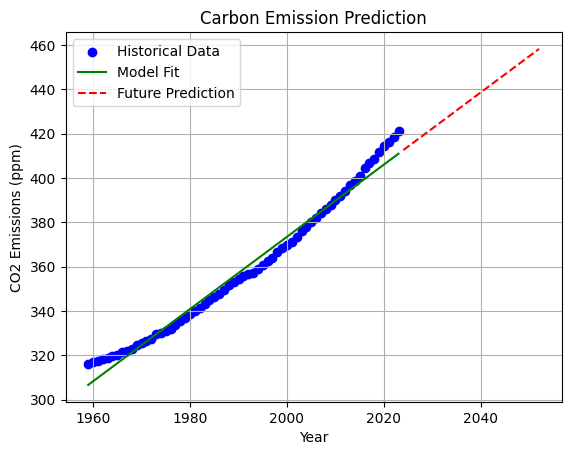

In [ ]:

plt.scatter(df['year'], df['ppm'], color="blue", label="Historical Data")
plt.plot(df['year'], model.predict(X), color="green", label="Model Fit")


plt.plot(future_years, future_emissions, color="red", linestyle="dashed", label="Future Prediction")
plt.xlabel("Year")
plt.ylabel("CO2 Emissions (ppm)")
plt.title("Carbon Emission Prediction")
plt.legend()
plt.grid()
plt.show()


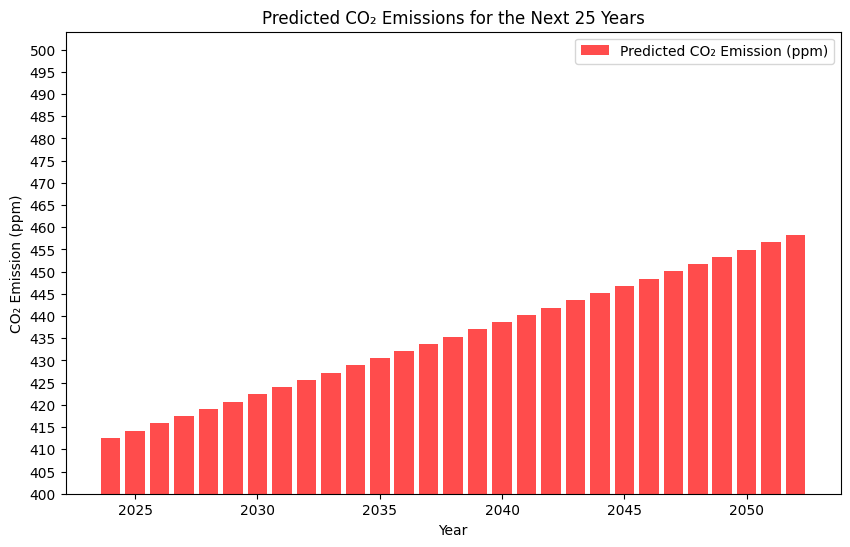

In [ ]:
combined_df = pd.concat([
    df[['year', 'ppm']].rename(columns={'year': 'year', 'ppm': 'CO₂ Emission (ppm)'}),
    pd.DataFrame({'Year': future_years.flatten(), 'CO₂ Emission (ppm)': future_emissions})
])

pivot_table = combined_df.pivot_table(index='Year', values='CO₂ Emission (ppm)')

plt.figure(figsize=(10, 6))
plt.bar(future_years.flatten(), future_emissions, color='red', label='Predicted CO₂ Emission (ppm)', alpha=0.7)
plt.title('Predicted CO₂ Emissions for the Next 25 Years')
plt.xlabel('Year')
plt.ylabel('CO₂ Emission (ppm)')
plt.ylim(400, max(future_emissions) * 1.1)
plt.yticks(range(400, int(max(future_emissions) * 1.1) + 1, 5))
plt.legend()
plt.show()

### **CORRELATION ANALYSIS (CO2 EMISSIONS vs TEMPERATURE)**

In [ ]:
data = pd.read_excel('/content/drive/MyDrive/correlatione.xlsx')


In [ ]:
print(data.head())
print(data.info())
print(data.describe())

      ppm  temp
0  329.68  0.00
1  330.19  0.01
2  331.13  0.02
3  332.03  0.04
4  333.84  0.07
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ppm     51 non-null     float64
 1   temp    51 non-null     float64
dtypes: float64(2)
memory usage: 944.0 bytes
None
              ppm       temp
count   51.000000  51.000000
mean   369.677451   0.479020
std     27.173833   0.291748
min    329.680000   0.000000
25%    346.980000   0.230000
50%    366.840000   0.440000
75%    390.975000   0.655000
max    421.080000   1.010000


In [ ]:
correlation_matrix = data[['ppm', 'temp']].corr()
print("Correlation Matrix:")
print(correlation_matrix)


Correlation Matrix:
           ppm      temp
ppm   1.000000  0.995457
temp  0.995457  1.000000


In [ ]:
import seaborn as sns

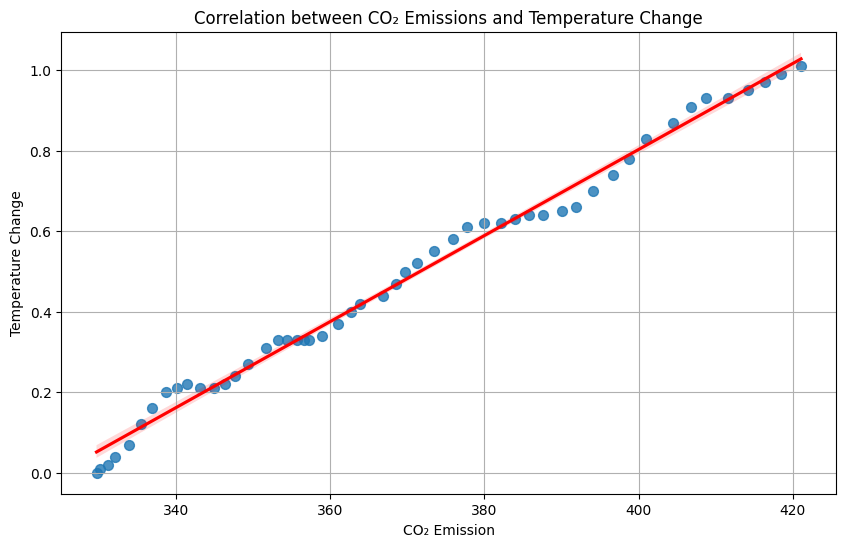

In [ ]:
plt.figure(figsize=(10, 6))
sns.regplot(x='ppm', y='temp', data=data, marker='o', scatter_kws={'s': 50}, line_kws={'color': 'red'})
plt.title("Correlation between CO₂ Emissions and Temperature Change")
plt.xlabel("CO₂ Emission")
plt.ylabel("Temperature Change")
plt.grid(True)
plt.show()

### **MELTING OF POLAR ICE CAPS- ANALYSIS AND PREDICTION**

In [ ]:
file_path = "/content/drive/MyDrive/icemelt.xls"
df = pd.read_excel(file_path)

In [ ]:
df.describe()

,year,ant_mass,gre_mass
count,232.000000,232.000000,232.000000
mean,2013.071293,-1228.396121,-2795.905086
std,6.596744,925.145388,1774.349001
min,2002.290000,-2797.410000,-5582.630000
25%,2007.350000,-2244.745000,-4303.000000
50%,2012.360000,-1051.740000,-2780.915000
75%,2019.472500,-365.012500,-1081.822500
max,2024.290000,84.670000,62.090000


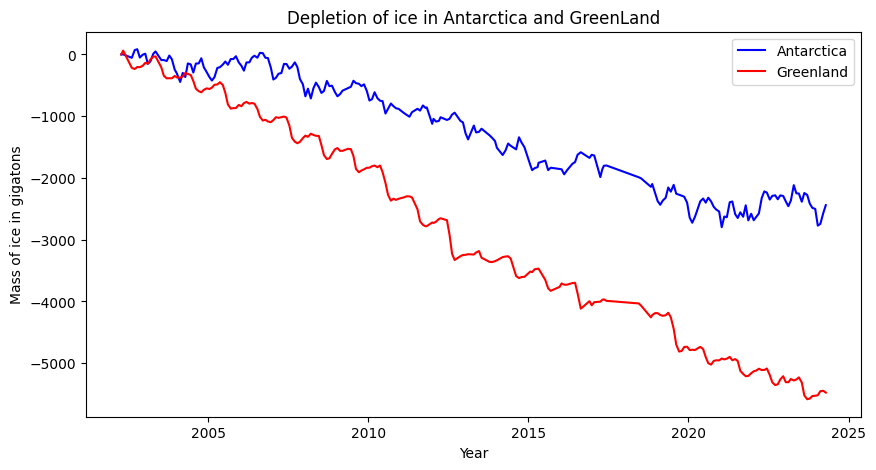

In [ ]:
plt.figure(figsize=(10, 5))

sns.lineplot(x='year', y='ant_mass', data=df, label='Antarctica', color='blue')
sns.lineplot(x='year', y='gre_mass', data=df, label='Greenland', color='red')

plt.title('Depletion of ice in Antarctica and GreenLand')
plt.xlabel('Year')
plt.ylabel('Mass of ice in gigatons')
plt.legend()
plt.show()

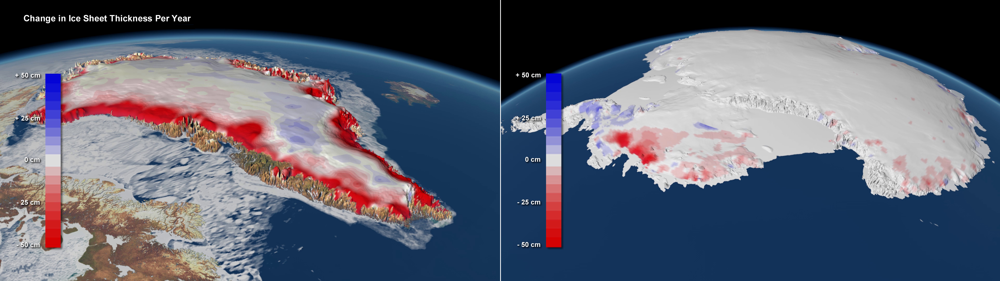

Antarctica Depletion - Mean Squared Error: 45893.88575195944
Antarctica Depletion - R-squared: 0.9356117243966119
Greenland Depletion - Mean Squared Error: 47890.53613429952
Greenland Depletion - R-squared: 0.9820922488819297


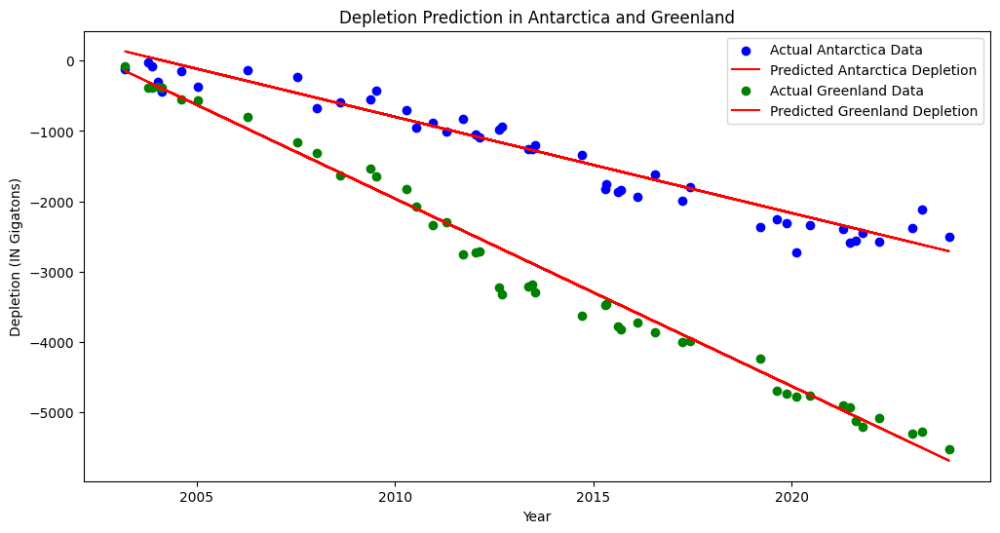



Predicted Depletion in Antarctica for 2024: -2715.72
Predicted Depletion in Greenland for 2024: -5700.88


Predicted Depletion in Antarctica for 2025: -2852.72
Predicted Depletion in Greenland for 2025: -5967.99


Predicted Depletion in Antarctica for 2026: -2989.72
Predicted Depletion in Greenland for 2026: -6235.09


Predicted Depletion in Antarctica for 2027: -3126.72
Predicted Depletion in Greenland for 2027: -6502.19


Predicted Depletion in Antarctica for 2028: -3263.72
Predicted Depletion in Greenland for 2028: -6769.29


Predicted Depletion in Antarctica for 2029: -3400.72
Predicted Depletion in Greenland for 2029: -7036.39


Predicted Depletion in Antarctica for 2030: -3537.72
Predicted Depletion in Greenland for 2030: -7303.49


Predicted Depletion in Antarctica for 2031: -3674.72
Predicted Depletion in Greenland for 2031: -7570.60


Predicted Depletion in Antarctica for 2032: -3811.72
Predicted Depletion in Greenland for 2032: -7837.70


Predicted Depletion in Antarctica f

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score
file_path = "/content/drive/MyDrive/icemelt.xls"
df = pd.read_excel(file_path)

required_columns = ['year', 'ant_mass', 'gre_mass']
if not all(col in df.columns for col in required_columns):
    missing_columns = [col for col in required_columns if col not in df.columns]
    raise KeyError(f"The following columns are missing in the DataFrame: {missing_columns}")

X = df[['year']]
y_antarctica = df['ant_mass']
y_greenland = df['gre_mass']

X_train, X_test, y_train_antarctica, y_test_antarctica = train_test_split(X, y_antarctica, test_size=0.2, random_state=42)
_, _, y_train_greenland, y_test_greenland = train_test_split(X, y_greenland, test_size=0.2, random_state=42)

model_antarctica = LinearRegression()
model_antarctica.fit(X_train, y_train_antarctica)

model_greenland = LinearRegression()
model_greenland.fit(X_train, y_train_greenland)

y_pred_antarctica = model_antarctica.predict(X_test)
y_pred_greenland = model_greenland.predict(X_test)

mse_antarctica = mean_squared_error(y_test_antarctica, y_pred_antarctica)
r2_antarctica = r2_score(y_test_antarctica, y_pred_antarctica)

mse_greenland = mean_squared_error(y_test_greenland, y_pred_greenland)
r2_greenland = r2_score(y_test_greenland, y_pred_greenland)

print("Antarctica Depletion - Mean Squared Error:", mse_antarctica)
print("Antarctica Depletion - R-squared:", r2_antarctica)
print("Greenland Depletion - Mean Squared Error:", mse_greenland)
print("Greenland Depletion - R-squared:", r2_greenland)

plt.figure(figsize=(12, 6))
plt.scatter(X_test, y_test_antarctica, color='blue', label='Actual Antarctica Data')
plt.plot(X_test, y_pred_antarctica, color='red', label='Predicted Antarctica Depletion')
plt.scatter(X_test, y_test_greenland, color='green', label='Actual Greenland Data')
plt.plot(X_test, y_pred_greenland, color='red', label='Predicted Greenland Depletion')
plt.xlabel('Year')
plt.ylabel('Depletion (IN Gigatons)')
plt.title('Depletion Prediction in Antarctica and Greenland')
plt.legend()
plt.show()


future_years = list(range(2024, 2052))

predictions = pd.DataFrame(future_years, columns=['year'])

predictions['Antarctica_Depletion'] = model_antarctica.predict(predictions[['year']])
predictions['Greenland_Depletion'] = model_greenland.predict(predictions[['year']])


for year, ant_pred, green_pred in zip(predictions['year'], predictions['Antarctica_Depletion'], predictions['Greenland_Depletion']):
     print("\n")
     print(f"Predicted Depletion in Antarctica for {year}: {ant_pred:.2f}")
     print(f"Predicted Depletion in Greenland for {year}: {green_pred:.2f}")


### **GLACIERS MELTING ANALYSIS AND PREDICTION MODEL**

In [ ]:
file_path = "/content/drive/MyDrive/glacier.xlsx"
data = pd.read_excel(file_path)

In [ ]:
data.describe()

,year,melt
count,19.000000,19.000000
mean,2010.000000,-269.293684
std,5.627314,28.247464
min,2001.000000,-318.470000
25%,2005.500000,-285.775000
50%,2010.000000,-278.730000
75%,2014.500000,-243.845000
max,2019.000000,-216.350000


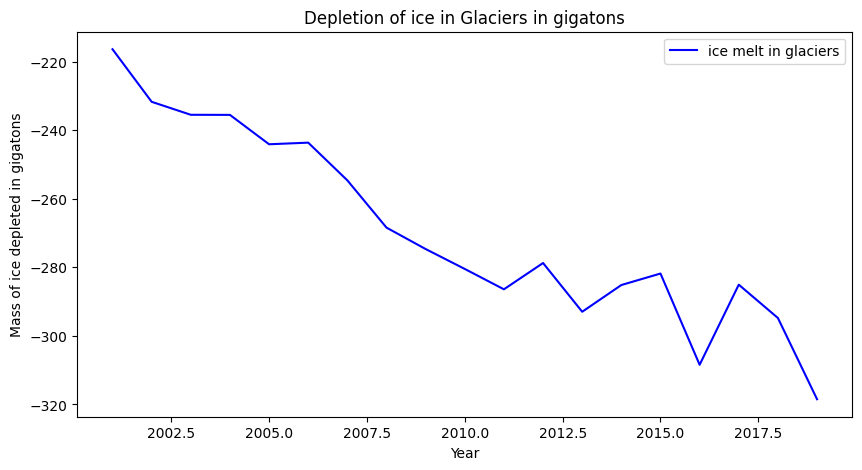

In [ ]:
plt.figure(figsize=(10, 5))

sns.lineplot(x='year', y='melt', data=data, label='ice melt in glaciers', color='blue')

plt.title('Depletion of ice in Glaciers in gigatons')
plt.xlabel('Year')
plt.ylabel('Mass of ice depleted in gigatons')
plt.legend()
plt.show()

In [ ]:
X = data[['year']].values  # Reshape year as a 2D array
y = data['melt'].values


In [ ]:
model = LinearRegression()
model.fit(X, y)


LinearRegression()

In [ ]:
future_years = np.arange(data['year'].max() + 1, data['year'].max() + 34).reshape(-1, 1)

future_predictions = model.predict(future_years)


Predicted ice depletion of glaciers in 2020: -316.84 gigatons
Predicted ice depletion of glaciers in 2021: -321.60 gigatons
Predicted ice depletion of glaciers in 2022: -326.35 gigatons
Predicted ice depletion of glaciers in 2023: -331.11 gigatons
Predicted ice depletion of glaciers in 2024: -335.86 gigatons
Predicted ice depletion of glaciers in 2025: -340.62 gigatons
Predicted ice depletion of glaciers in 2026: -345.37 gigatons
Predicted ice depletion of glaciers in 2027: -350.13 gigatons
Predicted ice depletion of glaciers in 2028: -354.88 gigatons
Predicted ice depletion of glaciers in 2029: -359.64 gigatons
Predicted ice depletion of glaciers in 2030: -364.39 gigatons
Predicted ice depletion of glaciers in 2031: -369.15 gigatons
Predicted ice depletion of glaciers in 2032: -373.90 gigatons
Predicted ice depletion of glaciers in 2033: -378.66 gigatons
Predicted ice depletion of glaciers in 2034: -383.41 gigatons
Predicted ice depletion of glaciers in 2035: -388.17 gigatons
Predicte

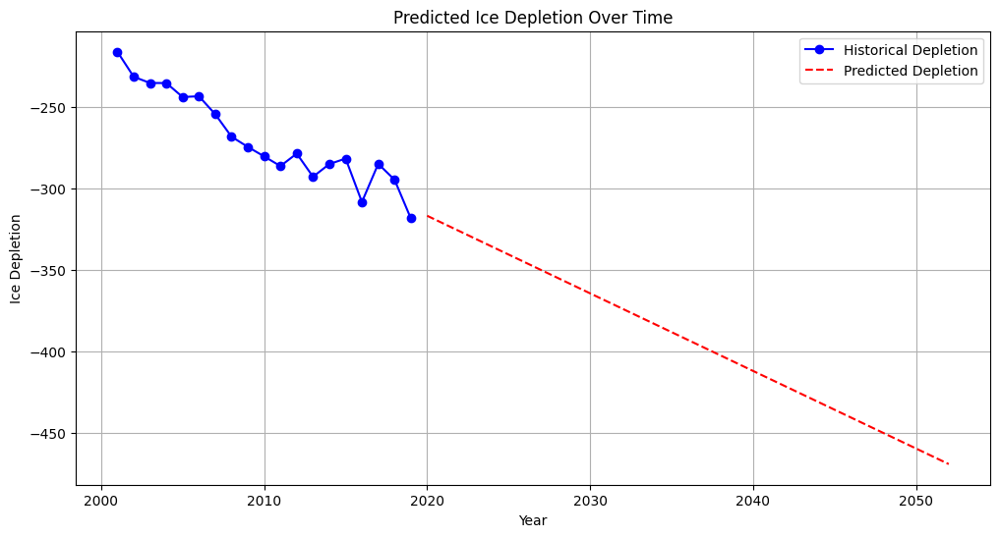

In [ ]:
for year, depletion in zip(future_years.flatten(), future_predictions):
        print(f"Predicted ice depletion of glaciers in {year:.0f}: {depletion:.2f} gigatons")



plt.figure(figsize=(12, 6))

plt.plot(data['year'], data['melt'], label='Historical Depletion', color='blue', marker='o')

plt.plot(future_years, future_predictions, label='Predicted Depletion', color='red', linestyle='--')

plt.title("Predicted Ice Depletion Over Time")
plt.xlabel("Year")
plt.ylabel("Ice Depletion")
plt.legend()
plt.grid(True)
plt.show()


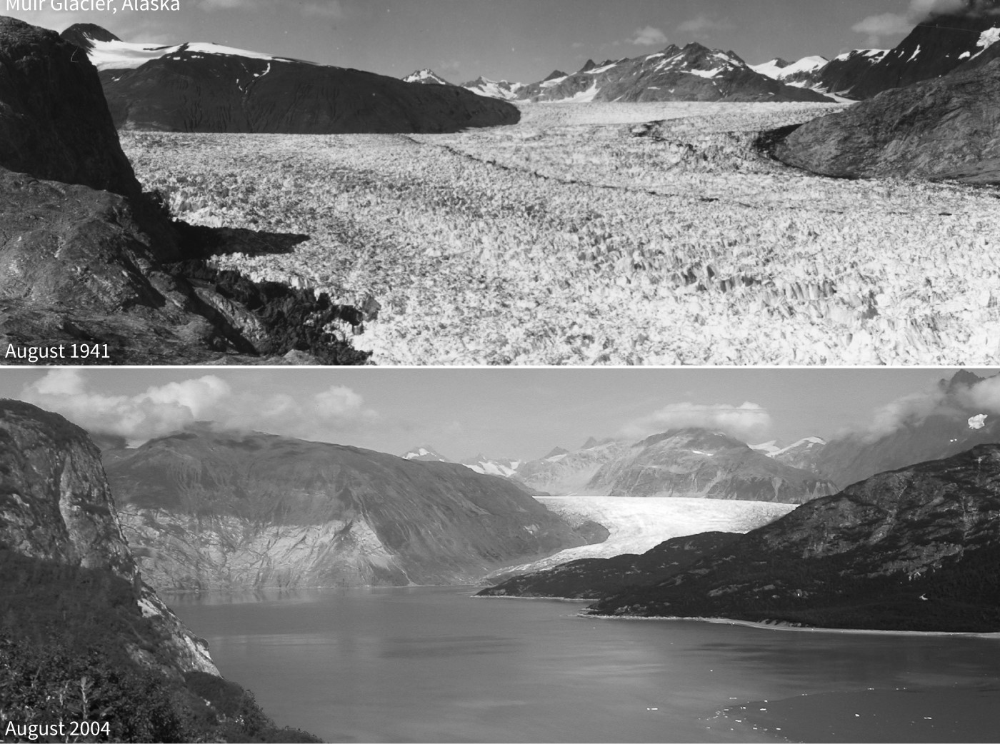

### **SEA LEVEL CHANGES ANALYSIS AND PREDICTION**

In [ ]:
file_path = "/content/drive/MyDrive/sealevel.xls"
data = pd.read_excel(file_path)

In [ ]:
data.describe()

,Year,NOAA - Adjusted sea level (inches)
count,44.000000,44.000000
mean,2001.500000,7.575255
std,12.845233,1.275303
min,1980.000000,5.854331
25%,1990.750000,6.475324
50%,2001.500000,7.338530
75%,2012.250000,8.516120
max,2023.000000,10.203904


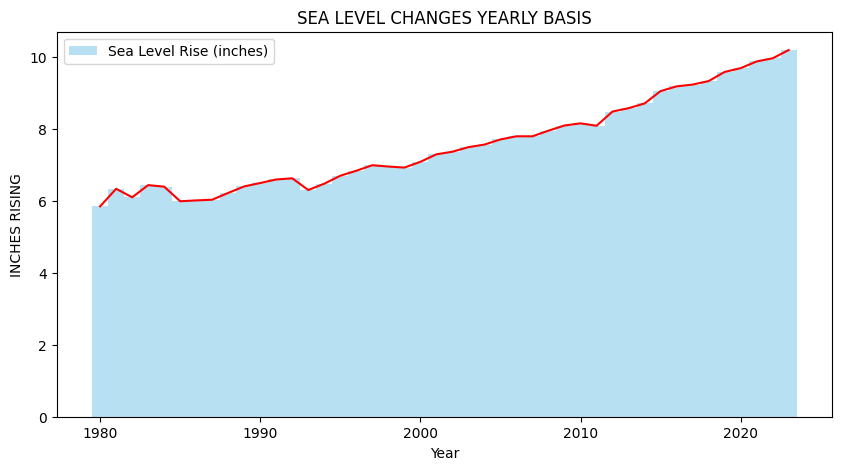

In [ ]:
plt.figure(figsize=(10, 5))


sns.lineplot(x='Year', y='NOAA - Adjusted sea level (inches)', data=data, color='red')
plt.bar(data['Year'], data['NOAA - Adjusted sea level (inches)'], color='skyblue', label='Sea Level Rise (inches)', alpha=0.6, width=1)
plt.title('SEA LEVEL CHANGES YEARLY BASIS')
plt.xlabel('Year')
plt.ylabel('INCHES RISING')
plt.legend()
plt.show()

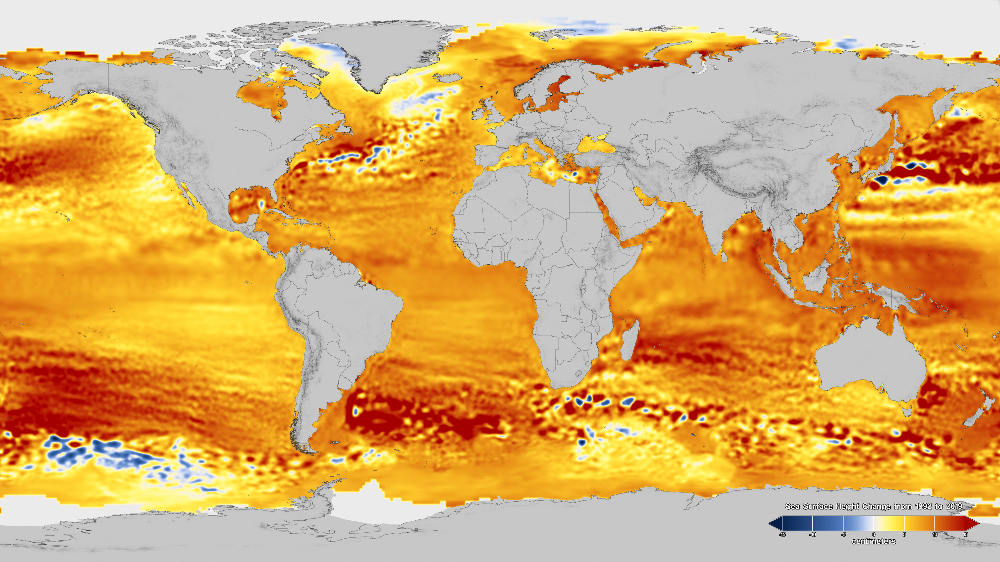

In [ ]:
X = data[['Year']].values
y = data['NOAA - Adjusted sea level (inches)'].values


Mean Squared Error: 0.06627735308292532
R-squared Score: 0.9578660137092997


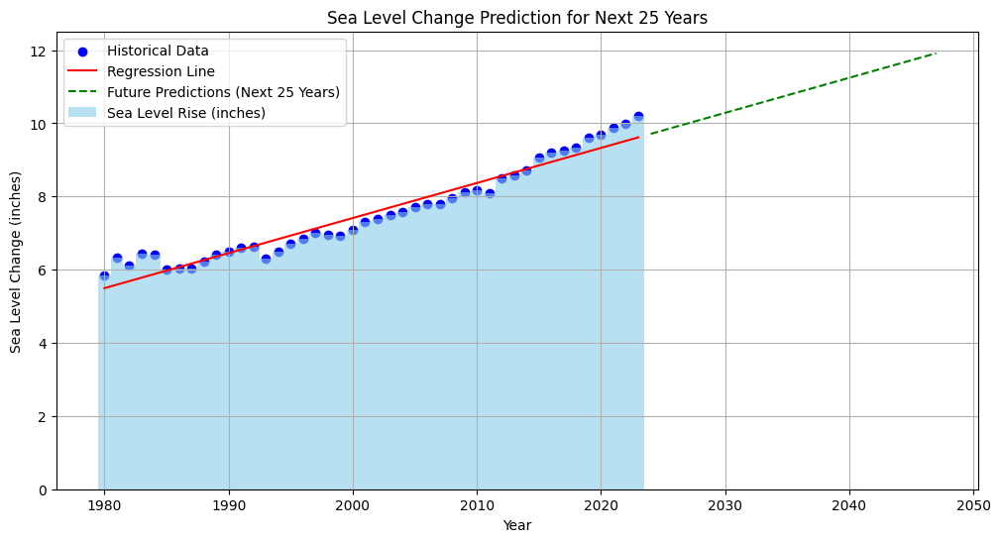

Predicted sea level rise in 2024: 9.71 inches
Predicted sea level rise in 2025: 9.81 inches
Predicted sea level rise in 2026: 9.90 inches
Predicted sea level rise in 2027: 10.00 inches
Predicted sea level rise in 2028: 10.09 inches
Predicted sea level rise in 2029: 10.19 inches
Predicted sea level rise in 2030: 10.29 inches
Predicted sea level rise in 2031: 10.38 inches
Predicted sea level rise in 2032: 10.48 inches
Predicted sea level rise in 2033: 10.57 inches
Predicted sea level rise in 2034: 10.67 inches
Predicted sea level rise in 2035: 10.77 inches
Predicted sea level rise in 2036: 10.86 inches
Predicted sea level rise in 2037: 10.96 inches
Predicted sea level rise in 2038: 11.05 inches
Predicted sea level rise in 2039: 11.15 inches
Predicted sea level rise in 2040: 11.24 inches
Predicted sea level rise in 2041: 11.34 inches
Predicted sea level rise in 2042: 11.44 inches
Predicted sea level rise in 2043: 11.53 inches
Predicted sea level rise in 2044: 11.63 inches
Predicted sea le

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

last_year = data['Year'].max()
future_years = np.arange(last_year + 1, last_year + 25).reshape(-1, 1)

future_predictions = model.predict(future_years)

plt.figure(figsize=(12, 6))

plt.scatter(data['Year'], data['NOAA - Adjusted sea level (inches)'], color='blue', label='Historical Data')

plt.plot(data['Year'], model.predict(X), color='red', label='Regression Line')
plt.bar(data['Year'], data['NOAA - Adjusted sea level (inches)'], color='skyblue', label='Sea Level Rise (inches)', alpha=0.6, width=1)

plt.plot(future_years, future_predictions, color='green', linestyle='--', label='Future Predictions (Next 25 Years)')

plt.title("Sea Level Change Prediction for Next 25 Years")
plt.xlabel("Year")
plt.ylabel("Sea Level Change (inches)")
plt.legend()
plt.grid(True)
plt.show()


for year, rise in zip(future_years.flatten(), future_predictions):
    print(f"Predicted sea level rise in {year}: {rise:.2f} inches")




### **CORRELATIONS**

In [ ]:
file_path = '/content/drive/MyDrive/correlationmain.xls'
df = pd.read_excel(file_path)


In [ ]:
print(df.head())

     temp     ppm       ice   sea   g;acier
0  1.5704  414.69  -8416.60   9.71  -316.84
1  1.5921  416.32  -8820.71   9.81  -321.60
2  1.6137  417.95  -9224.81   9.90  -326.35
3  1.6354  419.58  -9628.91  10.00  -331.11
4  1.6571  421.21 -10033.01  10.09  -335.86


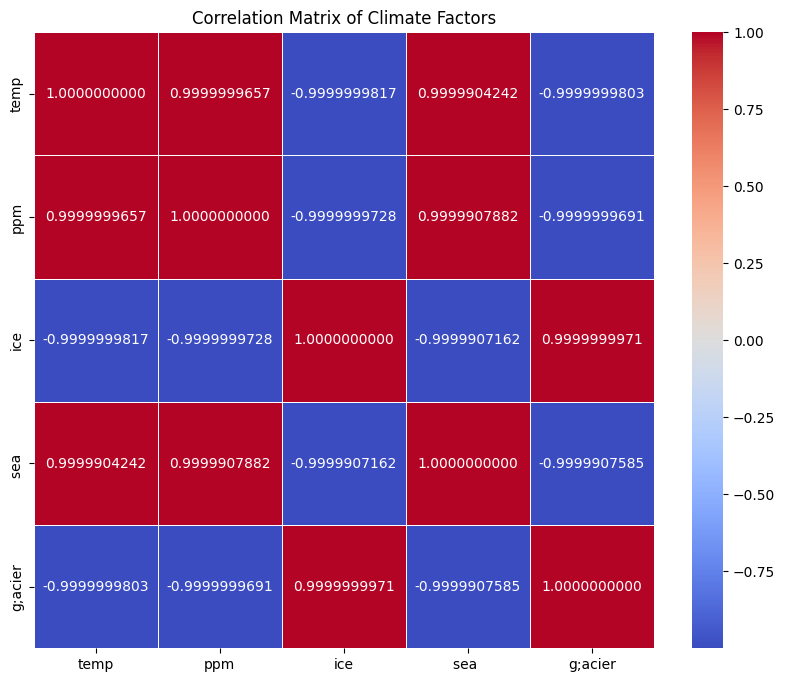

In [ ]:
correlation_matrix = df.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".10f", linewidths=0.5)
plt.title("Correlation Matrix of Climate Factors")
plt.show()